



**Important** (Set your directory to the folder "APS360_Project" here). This will be used throughout the rest of the notebook.

 **Note** this is a cleaned version of the notebook used to evaluate the best model architecture on theunseen test set. The other 3 architectures (U-Net, SK-U-Net, and SK-U-Net with Resnet backbone) also had their evaluation scripts, which are identical except the model is replaced. Only the UNet++ (best model) evaluation script was cleaned as is displayed here.

In [ ]:
path_to_APS360_Project = "/content/drive/MyDrive/"


In [ ]:
import torch
import numpy as np


import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import random_split, DataLoader
from torch.utils import data

from skimage.io import imread
import os

import time
import matplotlib.pyplot as plt

from PIL import Image
import albumentations as A
import random
import cv2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Dataset

In [ ]:
class SegmentationDataSet(data.Dataset):
    def __init__(self,
                 inputs: list,
                 images_root, 
                 targets_root,
                 resize_to,
                 transform=None                 
                 ):
        self.inputs = inputs
        self.images_root = images_root
        self.targets_root = targets_root
        self.transform = transform
        self.resize_to = resize_to
  
    def __len__(self):
        return len(self.inputs)

    def __getitem__(self,
                    index: int):
        # Select the sample
        input_ID = self.inputs[index]
        img_path = os.path.join(self.images_root, input_ID) #may need to add in .png at end
        img = cv2.imread(img_path,  cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, (self.resize_to, self.resize_to)) 

        mask_path = os.path.join(self.targets_root, input_ID) 
        mask = cv2.imread(mask_path,  cv2.IMREAD_GRAYSCALE)#Image.open(mask_path).convert("L") #grayscale
        mask = cv2.resize(mask, (self.resize_to,self.resize_to))

        # Preprocessing
        if self.transform is not None:
            aug = self.transform(image=img, mask=mask)
            img = aug["image"]
            mask = aug["mask"]
           
        img = torch.tensor(img).unsqueeze(0)
        mask = torch.tensor(mask).unsqueeze(0)
        img = img/255
        mask = mask/255 #to normalize
        
        return img, mask, input_ID

In [ ]:

test_img_root = os.path.join(path_to_APS360_Project, "APS360_Project/Dataset_Expanded/Test/images")
test_mask_root = os.path.join(path_to_APS360_Project, "APS360_Project/Dataset_Expanded/Test/masks")
test_inps = os.listdir(test_img_root) 


In [ ]:
resized_to = 224
test_dset = SegmentationDataSet(test_inps, test_img_root, test_mask_root, resized_to)

In [ ]:
print("Test set has: ", len(test_dset))

Test set has:  130


**Model**

In [ ]:
!pip install  segmentation_models_pytorch 
import segmentation_models_pytorch as smp


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 97 kB 6.8 MB/s 
     |████████████████████████████████| 58 kB 7.1 MB/s 
     |████████████████████████████████| 376 kB 57.8 MB/s 
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16446 sha256=d8cd8c9d89283013884bb53dcc562f170f9cf9d9ff38b8028cb9a412b4e1b6ab
  Stored in directory: /root/.cache/pip/wheels/0e/cc/b2/49e74588263573ff778da58cc99b9c6349b496636a7e165be6
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60966 sha256=e55b8d9e3ba2b0b73f536b1b0676470c405a253a97d89276727522764e6f631f
  Stored in directory: /root/.cache/pip/wheels/ed/27/e8/9543d42de2740d3544db96aefef63bda3f2c1761b3334f4873
Successfully built efficientnet-pytorch pretrainedmodels


In [ ]:
class UNetPP(nn.Module):
  def __init__(self, name):
     super(UNetPP,self).__init__()
     self.net = smp.UnetPlusPlus(encoder_name='resnet34', 
                  encoder_depth=5, 
                  encoder_weights='imagenet', 
                  decoder_use_batchnorm=True, 
                  decoder_channels=(256, 128, 64, 32, 16), 
                  decoder_attention_type=None, 
                  in_channels=1, 
                  classes=1, 
                  activation=None, 
                  aux_params=None)
     self.name = name
  def forward(self, x):
    return self.net(x)

In [ ]:
#test if the model has errors by passing in a dummy input tensor
z = torch.randn(16,1,224,224)
m = UNetPP("dummy")
m.eval()
m(z).shape


Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth


  0%|          | 0.00/83.3M [00:00<?, ?B/s]

torch.Size([16, 1, 224, 224])

Loss

In [ ]:
class DiceLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):    
        
        #flatten label and prediction tensors
        inputs = torch.sigmoid(inputs) #WITH LOGITS
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        intersection = (inputs * targets).sum()                            
        dice = (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        
        return 1 - dice

**Evaluating**

In [ ]:
from numba import cuda 

if torch.cuda.is_available():
  device = cuda.get_current_device()
  device.reset()


is_cuda = torch.cuda.is_available()

# Use GPU if available. device vairable will also be used later in the code.
if is_cuda:
    device = torch.device("cuda")
    print("GPU is available")
else:
    device = torch.device("cpu")
    print("GPU not available, CPU used")


GPU is available


In [ ]:
model = UNetPP(name="UNetPP_resnetbackbone_fold1")#, retain_dim=True)
model.to(device)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth


  0%|          | 0.00/83.3M [00:00<?, ?B/s]

UNetPP(
  (net): UnetPlusPlus(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): Ba

In [ ]:
from torchsummary import summary
summary(model, (1,224,224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           3,136
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]          36,864
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
       BasicBlock-11           [-1, 64, 56, 56]               0
           Conv2d-12           [-1, 64, 56, 56]          36,864
      BatchNorm2d-13           [-1, 64, 56, 56]             128
             ReLU-14           [-1, 64,

In [ ]:
model_path = "/content/drive/MyDrive/APS360_Project/Final Testing/Unet++/fold1_freezelayers/model_UNetPP_224imgsize_combinedloss2_transferlearning_bs16_lr0.001_epoch35" #"/content/model_SKUNet_resnetbackbone_fold2_bs16_lr0.001_epoch47" #"/content/model_UNet_resnetbackbone_224imgsize_combinedloss2_bs16_lr0.001_epoch32"#get_model_name(name="modeld", batch_size=128, learning_rate=0.001, epoch=36)
state = torch.load(model_path)
model.load_state_dict(state) #load weights of the best model onto the best model architecture

# model.to(device)
model.eval()

UNetPP(
  (net): UnetPlusPlus(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): Ba

In [ ]:
model2 = UNetPP(name="UNetPP_resnetbackbone_fold2")#, retain_dim=True)
model2.to(device)
model_path2 = "/content/drive/MyDrive/APS360_Project/Final Testing/Unet++/fold2_freezelayers/model_UNetPP_fold2_frzn_bs16_lr0.001_epoch55" #"/content/drive/MyDrive/APS360_Project/Final Testing/Unet++/fold1_freezelayers/model_UNetPP_224imgsize_combinedloss2_transferlearning_bs16_lr0.001_epoch35" #"/content/model_SKUNet_resnetbackbone_fold2_bs16_lr0.001_epoch47" #"/content/model_UNet_resnetbackbone_224imgsize_combinedloss2_bs16_lr0.001_epoch32"#get_model_name(name="modeld", batch_size=128, learning_rate=0.001, epoch=36)
state2 = torch.load(model_path2)
model2.load_state_dict(state2) #load weights of the best model onto the best model architecture
model2.eval()

UNetPP(
  (net): UnetPlusPlus(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): Ba

In [ ]:
model3 = UNetPP(name="UNetPP_resnetbackbone_fold3")#, retain_dim=True)
model3.to(device)
model_path3 ="/content/drive/MyDrive/APS360_Project/Final Testing/Unet++/fold3_freezelayers/model_UNetPP_fold3_freezelayers_bs16_lr0.001_epoch50"  #"/content/drive/MyDrive/APS360_Project/Final Testing/Unet++/fold2_freezelayers/model_UNetPP_fold2_frzn_bs16_lr0.001_epoch55" #"/content/drive/MyDrive/APS360_Project/Final Testing/Unet++/fold1_freezelayers/model_UNetPP_224imgsize_combinedloss2_transferlearning_bs16_lr0.001_epoch35" #"/content/model_SKUNet_resnetbackbone_fold2_bs16_lr0.001_epoch47" #"/content/model_UNet_resnetbackbone_224imgsize_combinedloss2_bs16_lr0.001_epoch32"#get_model_name(name="modeld", batch_size=128, learning_rate=0.001, epoch=36)
state3 = torch.load(model_path3)
model3.load_state_dict(state3) #load weights of the best model onto the best model architecture
model3.eval()

UNetPP(
  (net): UnetPlusPlus(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): Ba

In [ ]:
model4 = UNetPP(name="UNetPP_resnetbackbone_fold4")#, retain_dim=True)
model4.to(device)
model_path4 = "/content/drive/MyDrive/APS360_Project/Final Testing/Unet++/fold4_freezelayers/model_UNetPP_fold4_freezelayers_bs16_lr0.001_epoch51"#"/content/drive/MyDrive/APS360_Project/Final Testing/Unet++/fold3_freezelayers/model_UNetPP_fold3_freezelayers_bs16_lr0.001_epoch50"  #"/content/drive/MyDrive/APS360_Project/Final Testing/Unet++/fold2_freezelayers/model_UNetPP_fold2_frzn_bs16_lr0.001_epoch55" #"/content/drive/MyDrive/APS360_Project/Final Testing/Unet++/fold1_freezelayers/model_UNetPP_224imgsize_combinedloss2_transferlearning_bs16_lr0.001_epoch35" #"/content/model_SKUNet_resnetbackbone_fold2_bs16_lr0.001_epoch47" #"/content/model_UNet_resnetbackbone_224imgsize_combinedloss2_bs16_lr0.001_epoch32"#get_model_name(name="modeld", batch_size=128, learning_rate=0.001, epoch=36)
state4 = torch.load(model_path4)
model4.load_state_dict(state4) #load weights of the best model onto the best model architecture
model4.eval()

UNetPP(
  (net): UnetPlusPlus(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): Ba

Evaluation on Test Set

In [ ]:
#define loader
test_loader = torch.utils.data.DataLoader(test_dset, batch_size=4, 
                                           num_workers=4, shuffle=False)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
t = next(iter(test_loader))

In [ ]:
test_loader2 = DataLoader(dataset=test_dset, shuffle=False, batch_size=1, num_workers=4)
total_dice = 0
criterion = DiceLoss()
for i, data in enumerate(test_loader2, 0):
              # Get the inputs
              inputs, labels = data[0], data[1]
              #To Enable GPU Usage (if GPU available, otherwise device = CPU)
              inputs = inputs.to(device)
              labels = labels.to(device)
              outputs = (model(inputs) + model2(inputs) +model3(inputs)+model4(inputs))/4 #ensembling the 4 odel, one trained on each data fold, of the architecture
           
              dice = 1-criterion(outputs, labels).item()
            
              total_dice += dice
print(float(total_dice) / (i+1)) #avg test loss

For generating samples

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129


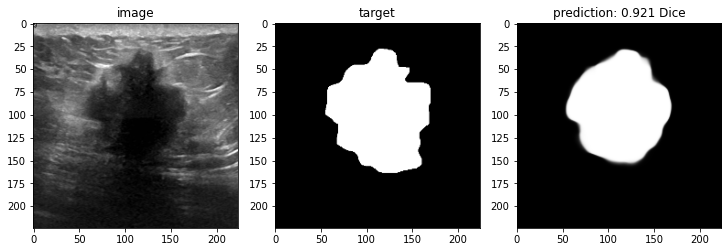

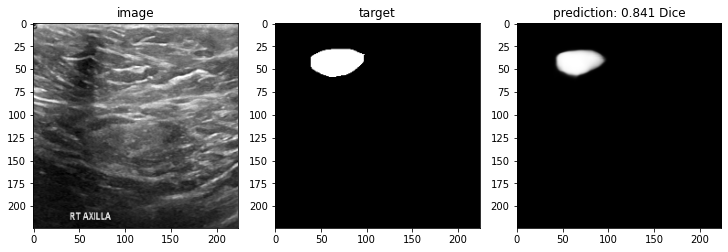

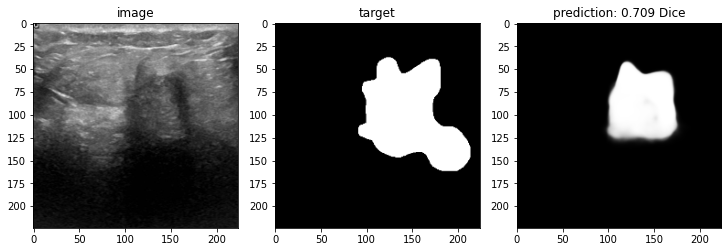

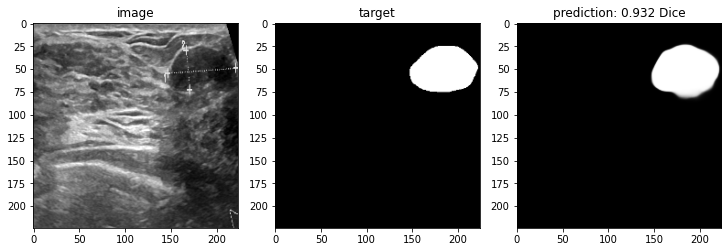

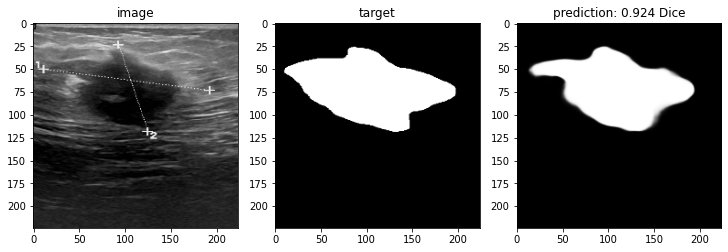

...

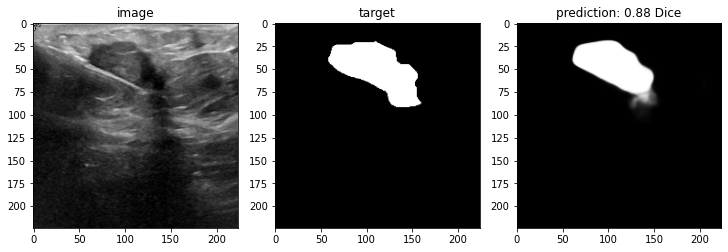

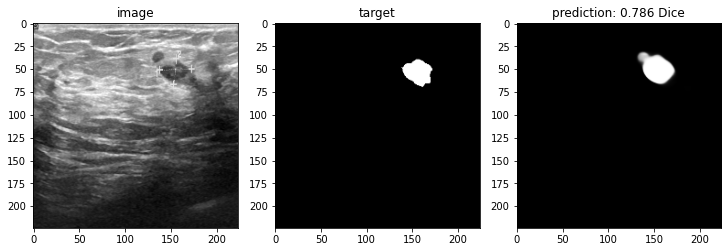

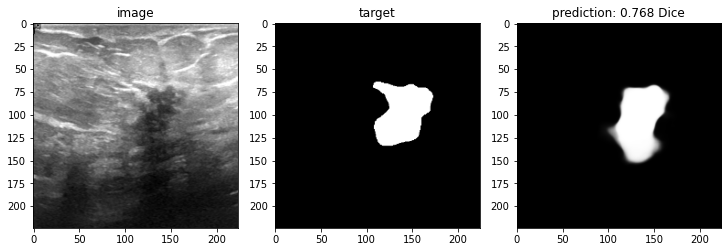

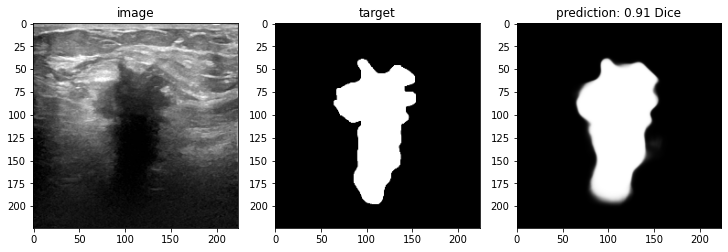

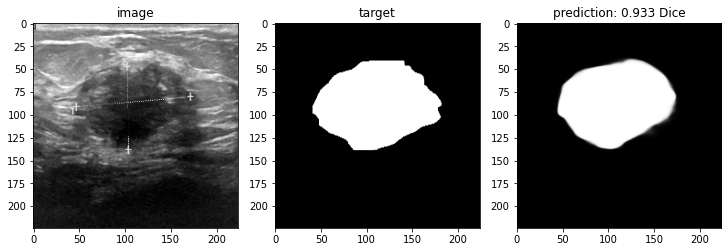

In [ ]:
test_loader2 = DataLoader(dataset=test_dset, shuffle=False, batch_size=1, num_workers=4)
# total_dice = 0
criterion = DiceLoss()
to_save = "/content/drive/MyDrive/APS360_Project/Final Testing/predictions_best_model"

for i, data in enumerate(test_loader2, 0):
              # Get the inputs
              inputs, labels, id = data[0], data[1], data[2]
              #To Enable GPU Usage (if GPU available, otherwise device = CPU)
              # print(id[0])
              inputs = inputs.to(device)
              labels = labels.to(device)
              outputs = (model(inputs) + model2(inputs) +model3(inputs)+model4(inputs))/4
           
              dice = 1-criterion(outputs, labels).item()
              f, axis = plt.subplots(nrows=1, ncols=3, constrained_layout=True, figsize=(10, 10))
              axis[0].set_title("image")
              axis[0].imshow(inputs.squeeze().cpu().data.numpy() *255, cmap='gray')
              axis[1].set_title("target")
              axis[1].imshow(labels.squeeze().cpu().data.numpy() *255, cmap='gray')
              axis[2].set_title("prediction: {} Dice".format(round(dice,3)))
              axis[2].imshow(torch.sigmoid(outputs).squeeze().cpu().data.numpy() *255, cmap='gray')

              f.savefig(os.path.join(to_save, id[0]))
              print(i)


Code used in video demo is below. It is the same as above, but only does the first 30 samples for time's sake

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


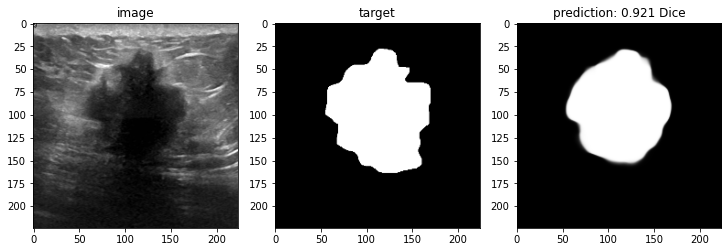

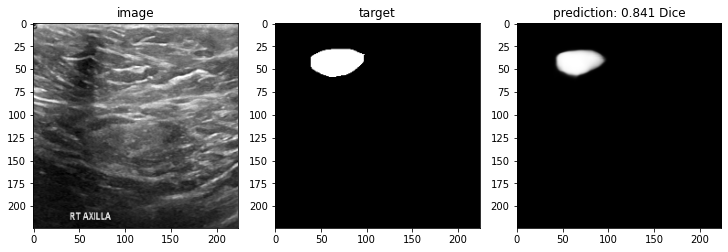

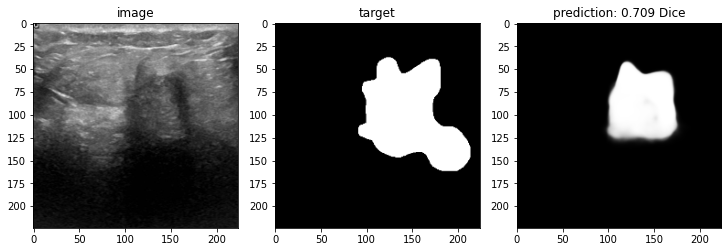

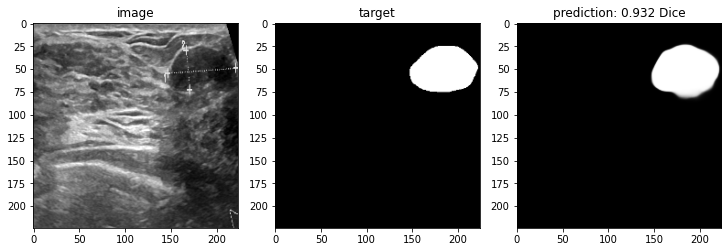

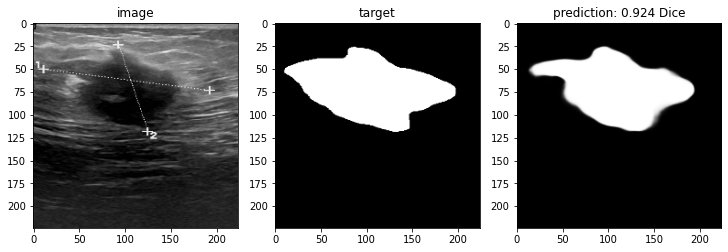

...

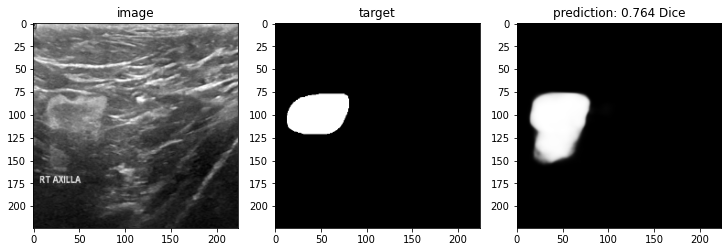

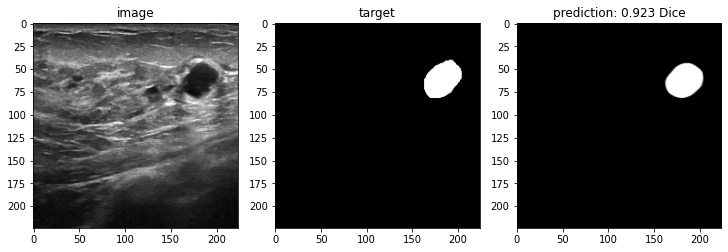

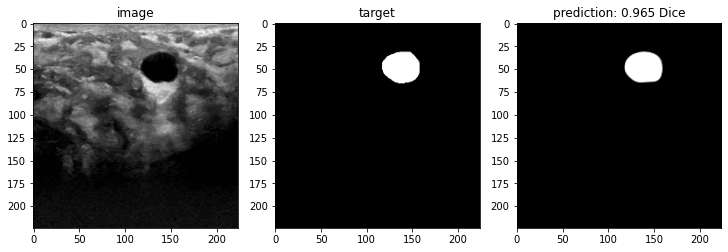

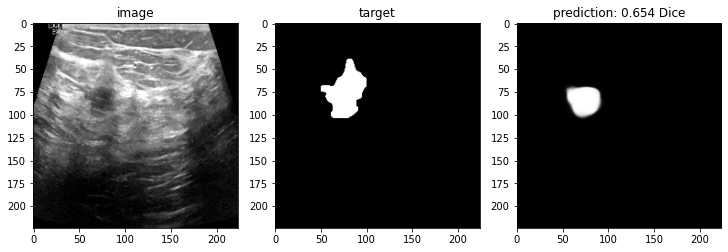

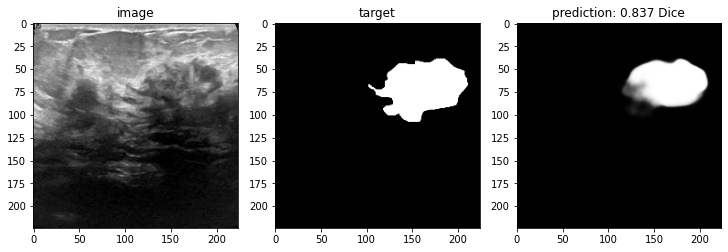

In [ ]:
test_loader2 = DataLoader(dataset=test_dset, shuffle=False, batch_size=1, num_workers=4)
criterion = DiceLoss()

for i, data in enumerate(test_loader2, 0):
              if i == 30:
                break
              # Get the inputs
              inputs, labels, id = data[0], data[1], data[2]
              #To Enable GPU Usage (if GPU available, otherwise device = CPU)
              # print(id[0])
              inputs = inputs.to(device)
              labels = labels.to(device)
              #print("reached here")
              outputs = (model(inputs) + model2(inputs) +model3(inputs)+model4(inputs))/4
              #print("here")
              #print(outputs.shape)
              #print(labels.shape)
              dice = 1-criterion(outputs, labels).item()
              f, axis = plt.subplots(nrows=1, ncols=3, constrained_layout=True, figsize=(10, 10))
              axis[0].set_title("image")
              axis[0].imshow(inputs.squeeze().cpu().data.numpy() *255, cmap='gray')
              axis[1].set_title("target")
              axis[1].imshow(labels.squeeze().cpu().data.numpy() *255, cmap='gray')
              axis[2].set_title("prediction: {} Dice".format(round(dice,3)))
              axis[2].imshow(torch.sigmoid(outputs).squeeze().cpu().data.numpy() *255, cmap='gray')

              # f.savefig(os.path.join(to_save, id[0]))
              # print(i)

              #print(loss)
              #print("SEPARATE")
              #print(loss.item())
              # total_dice += dice
# print(float(total_dice) / (i+1)) #avg validation loss